In [1]:
using Plots
using DSP
using FFTW

In [3]:
# # pulse_duration = 0.0005  #seconds
# starting_freq = 350e3     #hz
# ending_freq = 50e3     #hz

# freqs = LinRange(starting_freq, ending_freq, Int(samp_rate * pulse_duration));
# t_pulse = LinRange(0,pulse_duration,Int(samp_rate*pulse_duration));

In [2]:
samp_rate = 2e6  #hz
prf = 10  #Hz
τ = 0.05;
β = 250e3; #Pulse Bandwidth

In [3]:
prt = 1/prf;
t = 0:1/samp_rate:prt;

In [4]:
#Envelope Definition
envelope_type = "Rectangular"

if envelope_type == "Rectangular"
    a = ones(length(t));
    if(length(a) > τ * samp_rate)
        a[Int(τ*samp_rate):end] .= 0;
    end
elseif envelope_type == "Gaussian"
    a = exp.((-t.^2)/(τ^2)) #Gaussian
end


plot(t, a, title="Target Power Envelope")

In [32]:
pulse_type = "Increasing"

if pulse_type == "Increasing"
    pulse = a.*exp.(im*π*(β/τ)*t.^2);
elseif pulse_type == "Decreasing"
    pulse = a.*exp.(-im*π*β/τ*(t.^2 - 2*τ.*t));
elseif pulse_type == "NLFM"
    f0 = 200;
    f1 = 1000;
    k = (f1/f0)^(1/τ);
    phi0 = π/2;
    # pulse = a*sin(phi0 + 2*π*f0*(((k^t)-1)/log(k)))
    pulse_i = a.*sin.(phi0 .+ 2*π*f0*(((k.^t).-1)/log(k)));
    pulse_r = a.*cos.(phi0 .+ 2*π*f0*(((k.^t).-1)/log(k)));
    pulse = pulse_r .+ im*pulse_i;
end

200001-element Array{Complex{Float64},1}:
                1.0 + 0.0im
 0.9999999999922894 + 3.926990816977149e-6im
 0.9999999998766299 + 1.5707963267303003e-5im
  0.999999999375439 + 3.534291734552724e-5im
 0.9999999980260791 + 6.283185303045417e-5im
 0.9999999951808572 + 9.817477026697497e-5im
 0.9999999900070256 + 0.0001413716689406329im
 0.9999999814867812 + 0.00019242254884492123im
 0.9999999684172661 + 0.00025132740964131455im
 0.9999999494105672 + 0.00031808625081203214im
 0.9999999228937166 + 0.0003926990716055353im
 0.9999998871086911 + 0.00047516587097475634im
 0.9999998401124129 + 0.0005654866475080624im
                    ⋮
               -0.0 + 0.0im
               -0.0 - 0.0im
                0.0 - 0.0im
                0.0 + 0.0im
               -0.0 + 0.0im
               -0.0 - 0.0im
                0.0 - 0.0im
                0.0 + 0.0im
               -0.0 + 0.0im
               -0.0 - 0.0im
                0.0 - 0.0im
                0.0 + 0.0im

In [33]:
plot(t, abs.(pulse), xguide="Time", yguide="Maginitude", title="Pulse Power Envelope")

In [43]:
plot(t[0:50],real(pulse[0:50]))

BoundsError: [91mBoundsError: attempt to access 200001-element StepRangeLen{Float64,Base.TwicePrecision{Float64},Base.TwicePrecision{Float64}} at index [0:50][39m

In [30]:
plot(t, imag(pulse))

In [44]:
plot(LinRange(-samp_rate/2, samp_rate/2, length(pulse)), real(fftshift(fft(pulse))))

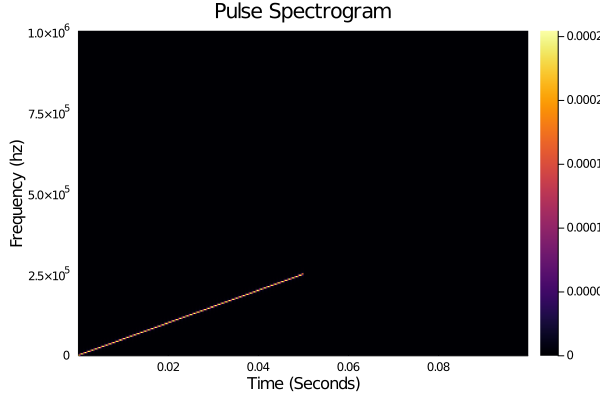

In [45]:
fft_size = 512;
spec = spectrogram((pulse), fft_size; fs=samp_rate);
heatmap(spec.time, LinRange(0,samp_rate/2, Int(fft_size/2)), spec.power[begin:Int(fft_size/2) , :], xguide="Time (Seconds)", yguide="Frequency (hz)", title="Pulse Spectrogram")

In [15]:
rx_pulse = pulse * 0.25;
pulse_compression = conv(rx_pulse, reverse(pulse));

In [17]:
plot(abs.(pulse_compression))

In [12]:
Threads.nthreads()

12